# Test Images Analysis - Combined Augmented Model

This notebook analyzes test images using the combined augmented model approach. We'll:
1. Load the trained model
2. Process test images
3. Create visualization maps with orientation arrows

In [9]:
import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
from torch import nn
from PIL import Image

# Add src directory to Python path for imports
sys.path.append(os.path.abspath('../src'))

# Import from our package
from fiber_predictor.neural_networks.model import CNN

In [10]:
# Configuration
config = {
    'image_size': (50, 50),
    'device': torch.device('cuda' if torch.cuda.is_available() else 'cpu')
}

MODEL_DIR = '../models/cnn'
IMAGE_DIR = '../images'

## 1. Load Combined Augmented Model

We load the combined augmented model which performed well in our experiments.

In [11]:
def load_model(model_name, model_params=None):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    if model_params:
        model = CNN(**model_params).to(device)
    else:
        model = CNN().to(device)

    model.load_state_dict(torch.load(
        os.path.join(MODEL_DIR, f'{model_name}.pth'),
        map_location=device
    ))
    model.eval()
    return model

model_params = {
    'in_channels': 1, 
    'conv_channels': [32, 64, 128],
    'pool_kernel': 2, 
    'activation': nn.ReLU, 
    'dropout': 0.2, 
    'fc_dims': [128, 64], 
    'output_dim': 1
}


# Load the combined augmented model
model_name = 'combined_augmented'
print(f"Loading model: {model_name}")
model = load_model(model_name)

Loading model: combined_augmented


In [12]:
def check_image(image):
    """Check if image is valid (not too bright/dark)"""
    img = np.array(image)
    if np.mean(img) < .05*256 or np.mean(img) > .95*256:
        return False
    return True

def slice_image(image, voxel_size):
    """Slice image into voxels"""
    height, width = image.shape
    voxel_list = []
    pos_list = []
    
    for y in range(0, height - voxel_size + 1, voxel_size):
        for x in range(0, width - voxel_size + 1, voxel_size):
            voxel = image[y:y + voxel_size, x:x + voxel_size]
            voxel_list.append(voxel)
            pos_list.append([x, y])
            
    return np.array(voxel_list), np.array(pos_list)

def preprocess_voxel(voxel):
    """Preprocess a single voxel for CNN prediction"""
    # Convert to PIL Image and resize
    voxel_img = Image.fromarray(voxel)
    voxel_img = voxel_img.resize(config['image_size'])
    
    # Convert to tensor and normalize
    voxel_tensor = torch.tensor(np.array(voxel_img), dtype=torch.float32)
    voxel_tensor = voxel_tensor.unsqueeze(0).unsqueeze(0)  # Add batch and channel dimensions
    voxel_tensor = voxel_tensor / 255.0  # Normalize to [0, 1]
    
    return voxel_tensor

def get_orientation_map(model, voxel_list, pos_list, voxel_size):
    """Generate orientation map for voxels"""
    angle_list = []
    x = pos_list[:, 0] + voxel_size / 2
    y = pos_list[:, 1] + voxel_size / 2
    u, v = [], []
    valid_count, invalid_count = 0, 0
    
    for voxel in voxel_list:
        if check_image(voxel):
            voxel_tensor = preprocess_voxel(voxel)
            voxel_tensor = voxel_tensor.to(config['device'])
            
            with torch.no_grad():
                model.eval()
                angle = model(voxel_tensor).cpu().numpy()[0][0]
                angle = angle * (np.pi/180)  # Convert to radians
            
            angle_list.append(angle)
            u.append(np.cos(angle))
            v.append(np.sin(angle))
            valid_count += 1
        else:
            angle_list.append(None)
            u.append(0)
            v.append(0)
            invalid_count += 1
    
    return x, y, u, v, angle_list, (valid_count, invalid_count)

def plot_map(image, img_name, x, y, u, v, counts, color="yellow", scale=1, figsize=(8, 8)):
    """Plot orientation map over image"""
    plt.figure(figsize=figsize)
    plt.imshow(image, cmap="gray")
    plt.quiver(x, y, u, v, color=color, pivot="middle", scale=scale)
    plt.axis("off")
    plt.title(f"Image: {img_name} | Valid voxels: {counts[0]} / {counts[0]+counts[1]}")
    plt.show()

def plot_angle_distribution(angle_list, img_name):
    """Plot histogram of predicted angles"""
    valid_angles = [angle for angle in angle_list if angle is not None]
    angles_degrees = np.array(valid_angles) * (180/np.pi)
    
    plt.figure(figsize=(12, 4))
    plt.hist(angles_degrees, bins=36, range=(0, 180))
    plt.title(f"Angle Distribution - {img_name}")
    plt.xlabel("Angle (degrees)")
    plt.ylabel("Count")
    plt.grid(True)
    plt.show()

## Test: Inferencing on Biological(Training) Dataset with Combined Model

Found 5 test images


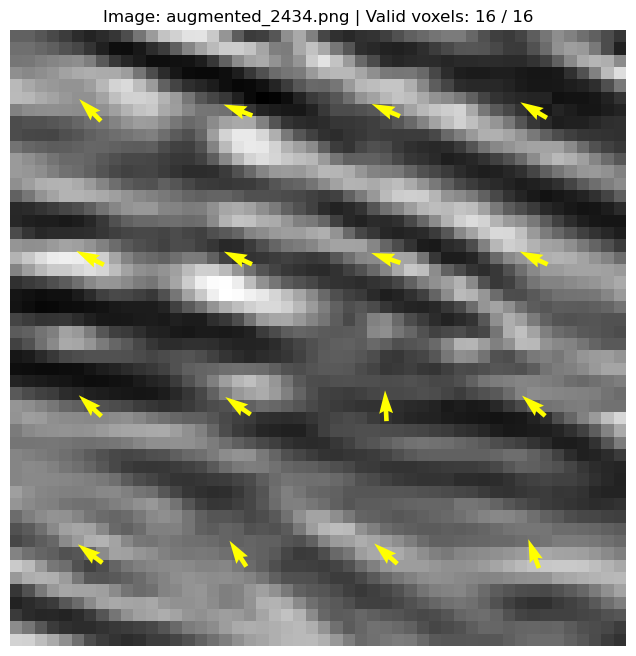

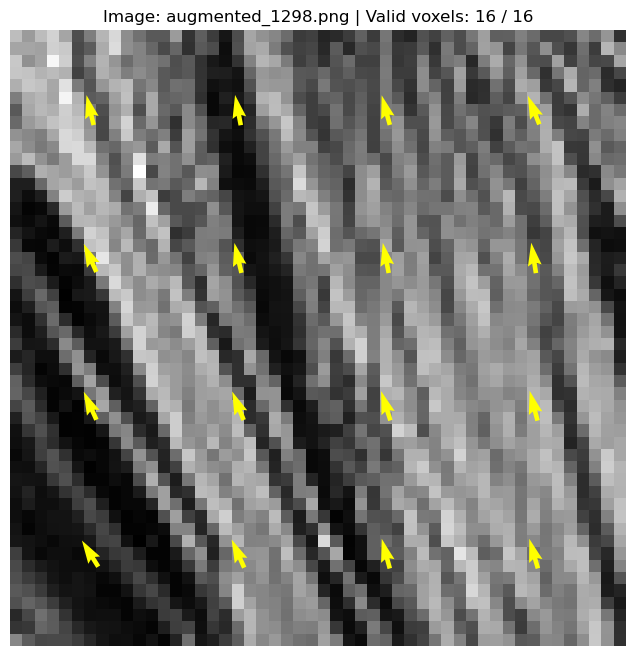

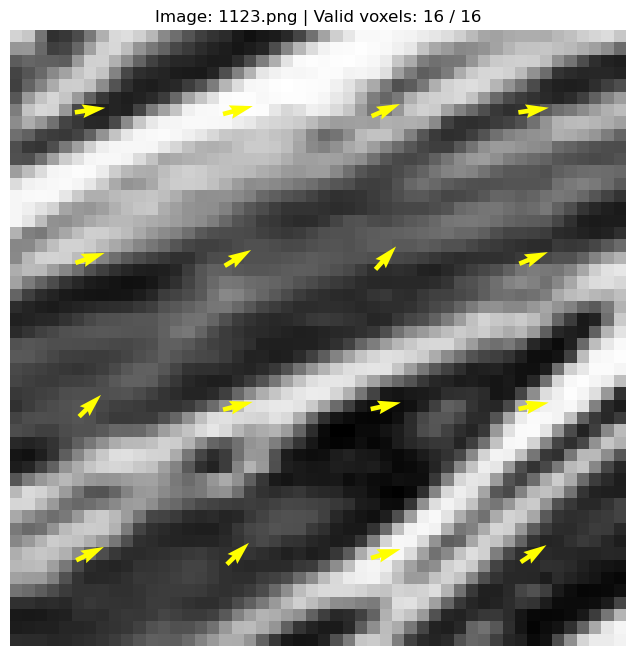

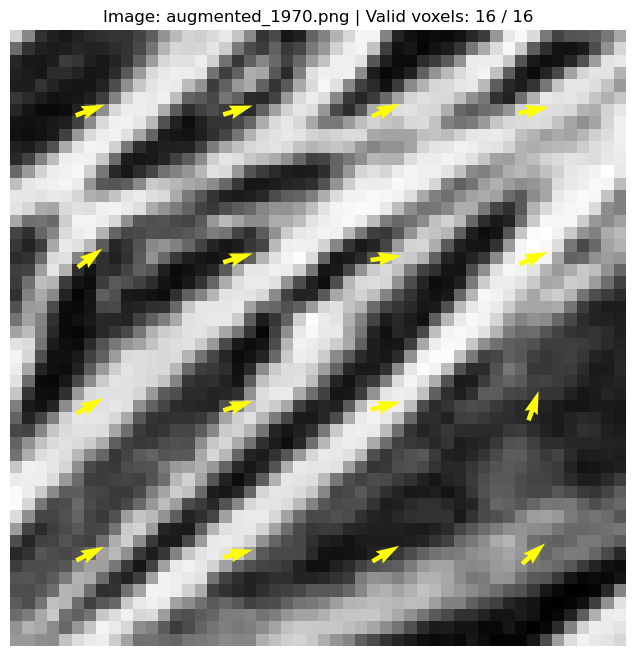

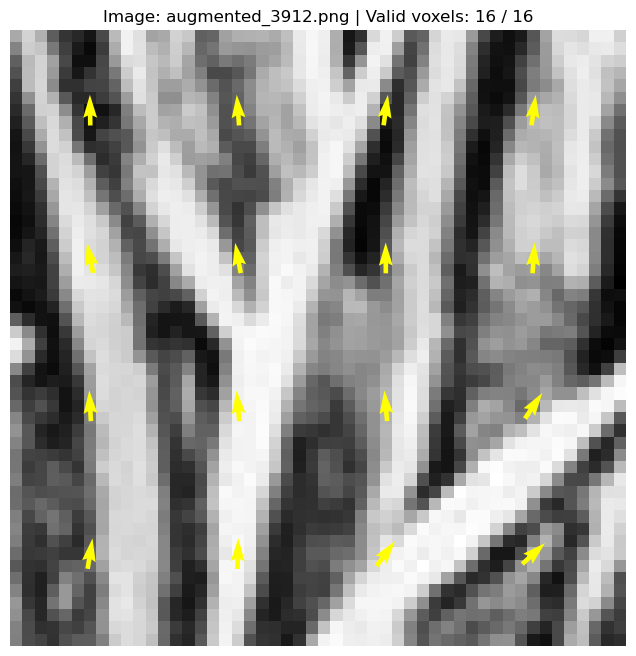

In [13]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/bio'
VOXEL_SIZE = 12

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.png')][::1024]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name, x, y, u, v, counts, scale=20)

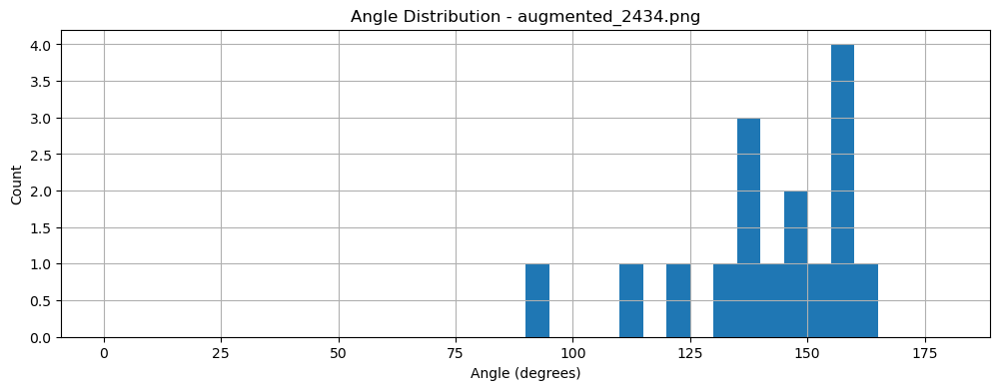

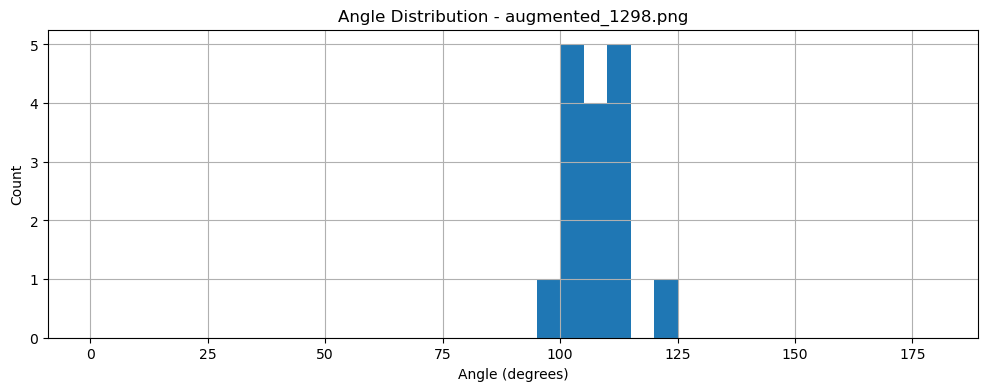

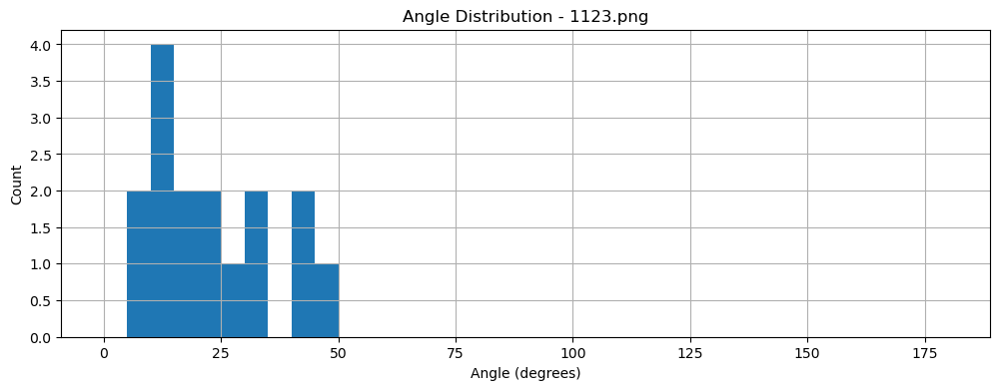

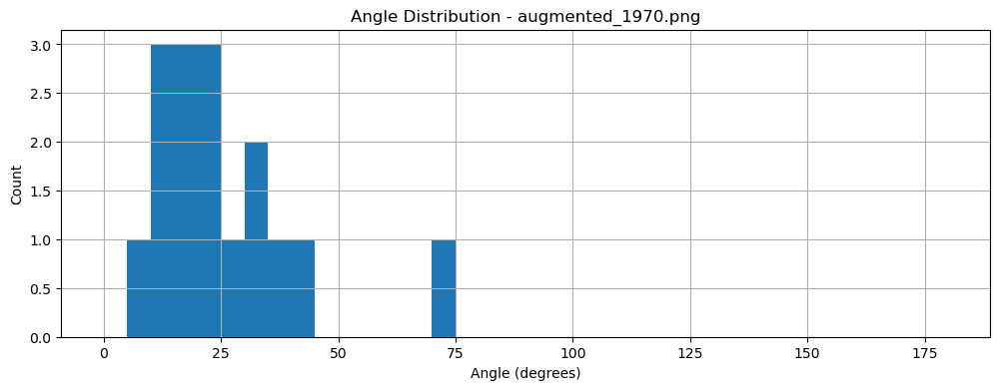

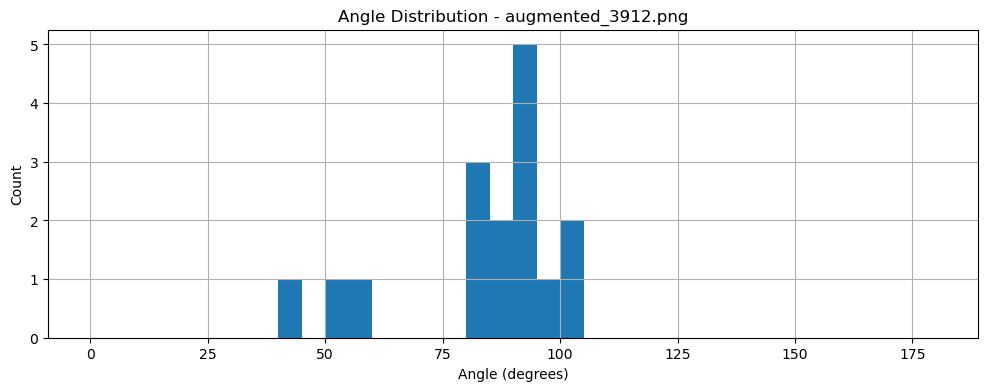

In [14]:
# Process images again but this time analyze angle distributions
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    image = np.array(Image.open(img_path).convert('L'))
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    _, _, _, _, angle_list, _ = get_orientation_map(model, voxel_list, pos_list, VOXEL_SIZE)
    plot_angle_distribution(angle_list, img_name)

## Test: Native Porcine, Commercial Porcine, Commercial Bovine with Combined Model

Found 3 test images


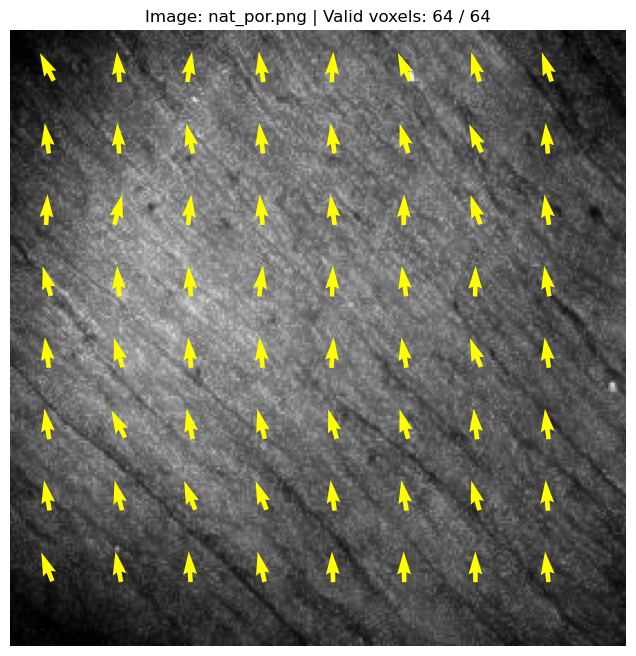

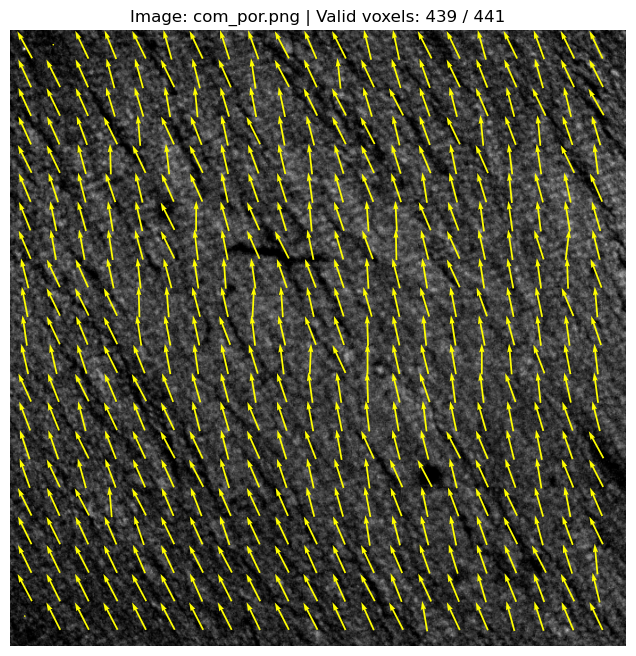

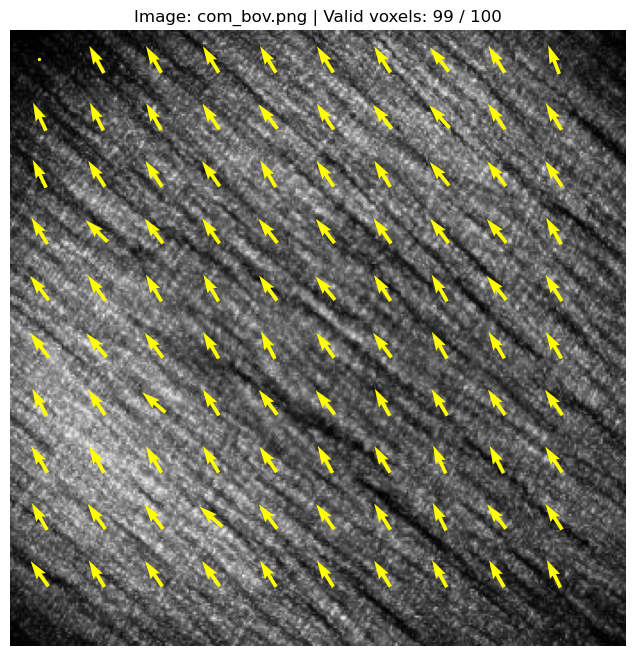

In [15]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/eda_new'
VOXEL_SIZE = 32

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.png')]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name, x, y, u, v, counts, scale=20)

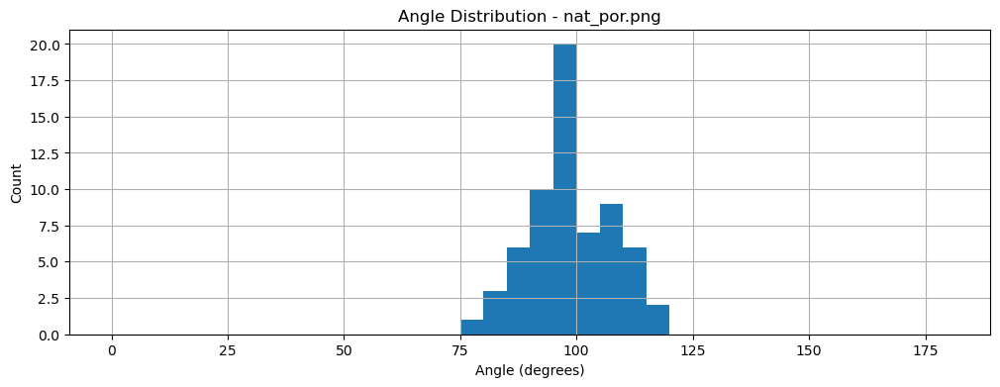

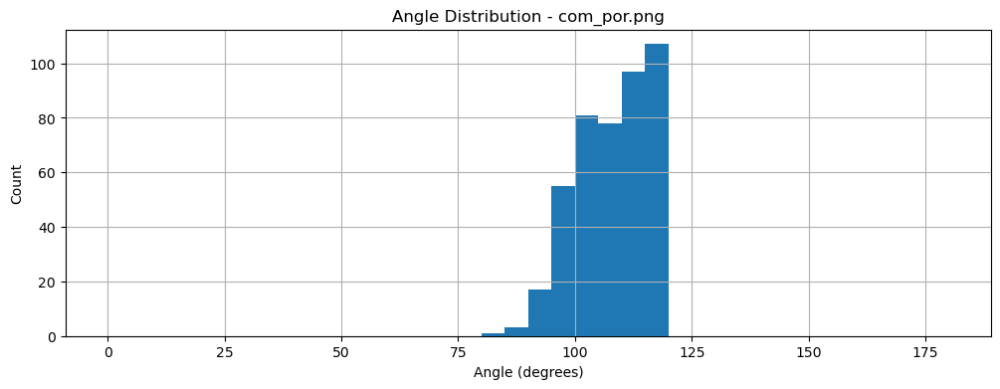

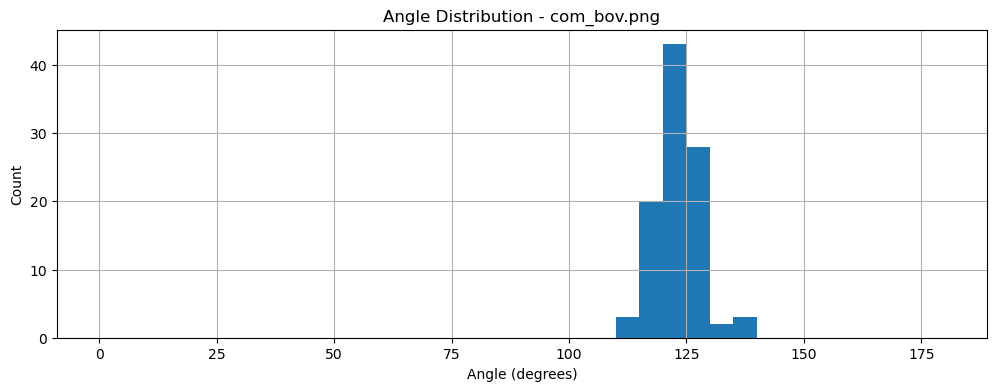

In [16]:
# Process images again but this time analyze angle distributions
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    image = np.array(Image.open(img_path).convert('L'))
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    _, _, _, _, angle_list, _ = get_orientation_map(model, voxel_list, pos_list, VOXEL_SIZE)
    plot_angle_distribution(angle_list, img_name)

## Test: Inferencing on Porcine(Pericardium) with Combined Model

Found 4 test images


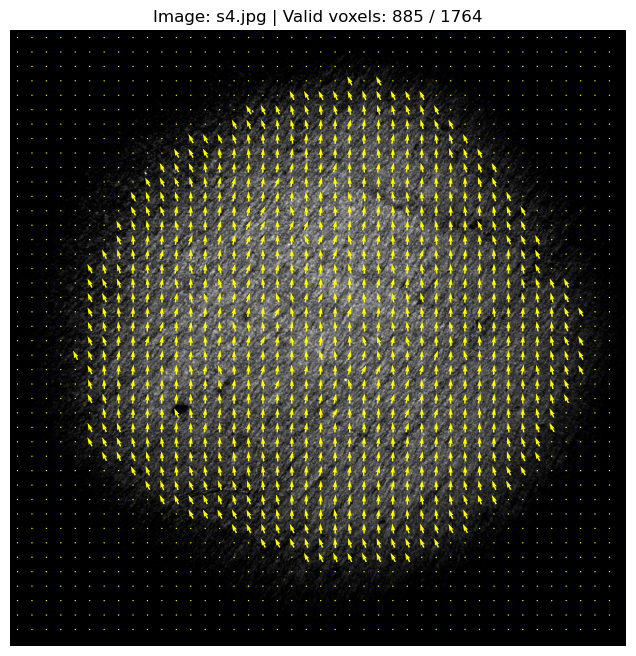

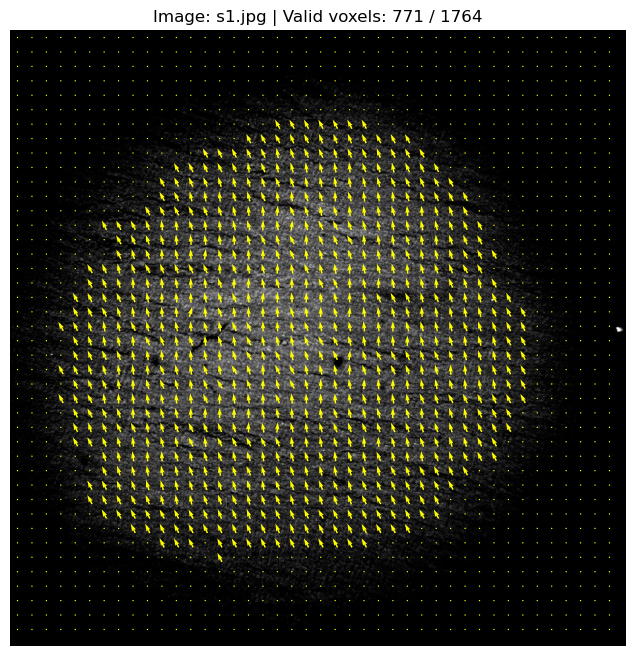

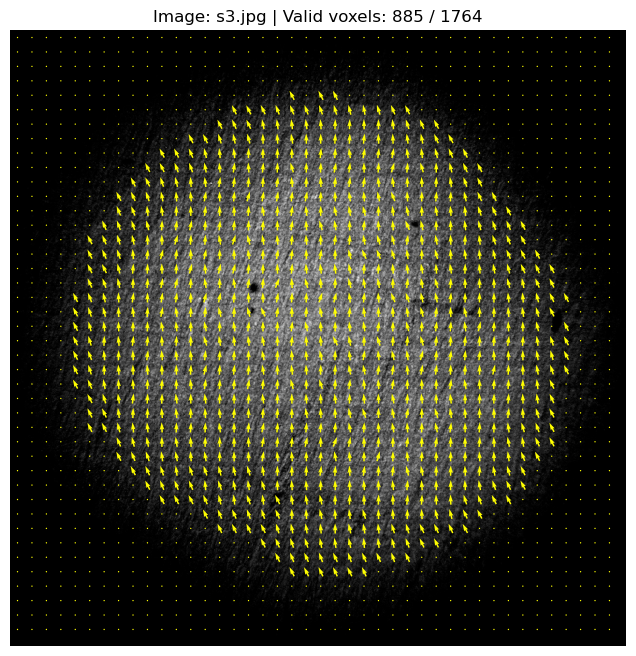

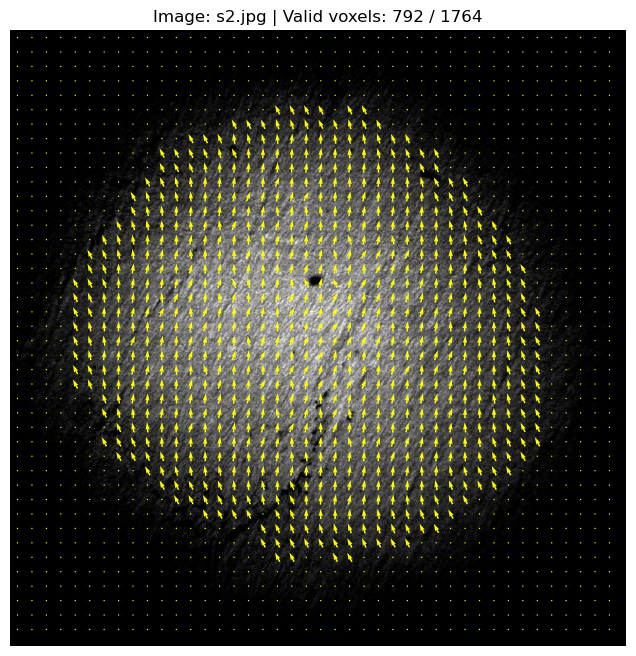

In [17]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/porcine_pericardium'
VOXEL_SIZE = 24

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.jpg')][:-1]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name, x, y, u, v, counts, scale=60)

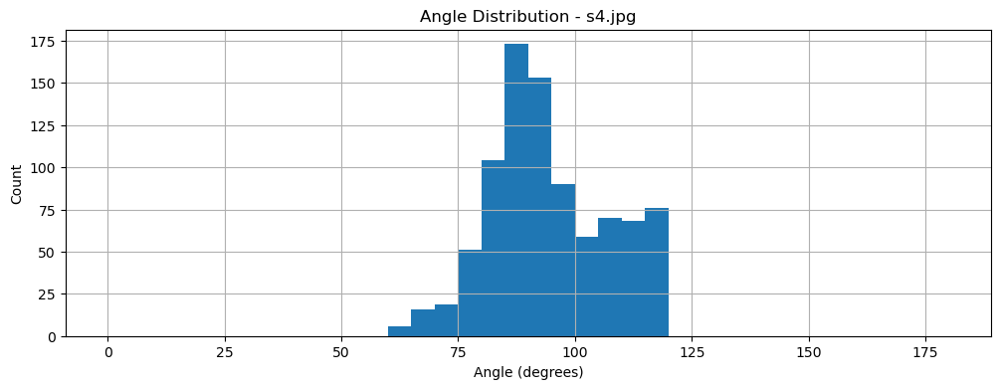

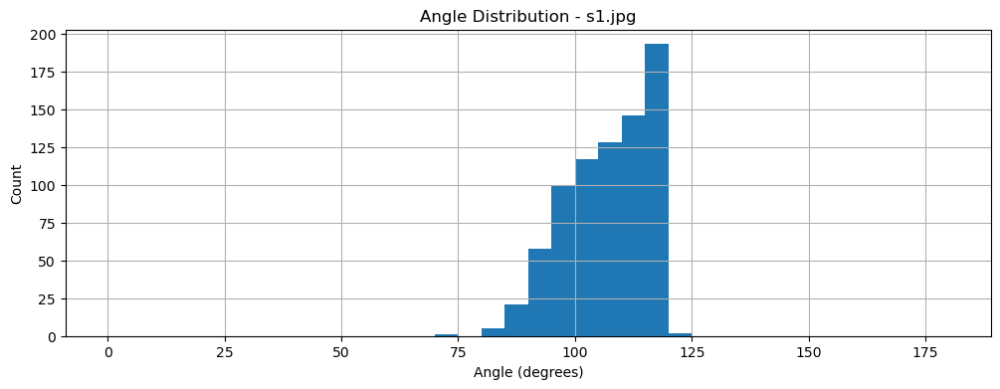

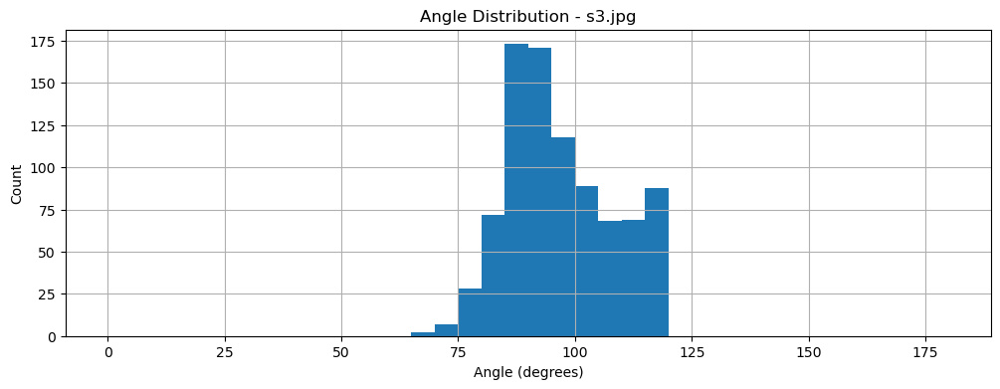

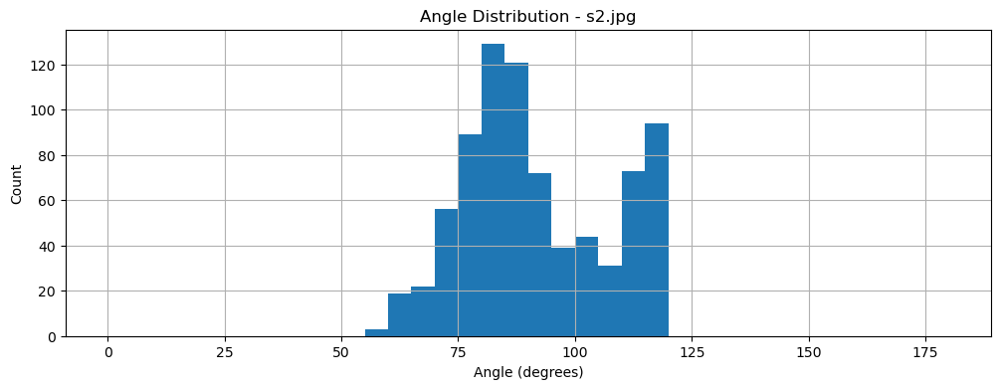

In [18]:
# Process images again but this time analyze angle distributions
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    image = np.array(Image.open(img_path).convert('L'))
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    _, _, _, _, angle_list, _ = get_orientation_map(model, voxel_list, pos_list, VOXEL_SIZE)
    plot_angle_distribution(angle_list, img_name)

##  Test: Inferencing on Generated Images with Diffusion Combined Model


In [20]:
# Load the combined augmented model
model_name = 'diff_augmented'
print(f"Loading model: {model_name}")
model = load_model(model_name)

Loading model: diff_augmented


Found 3 test images


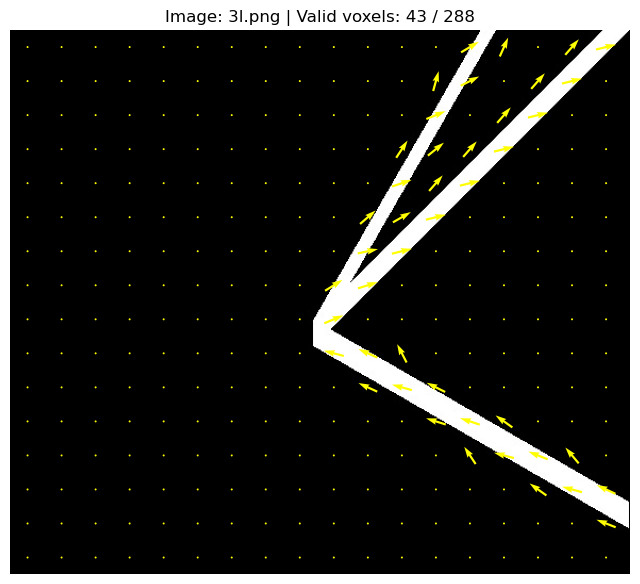

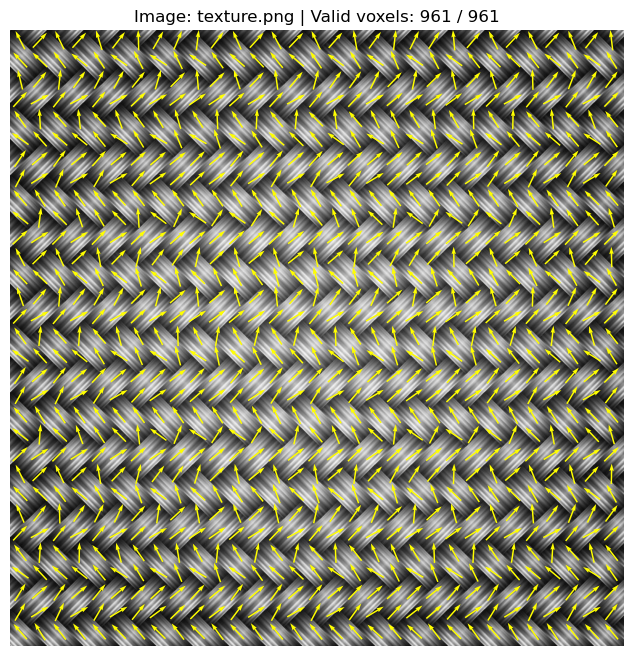

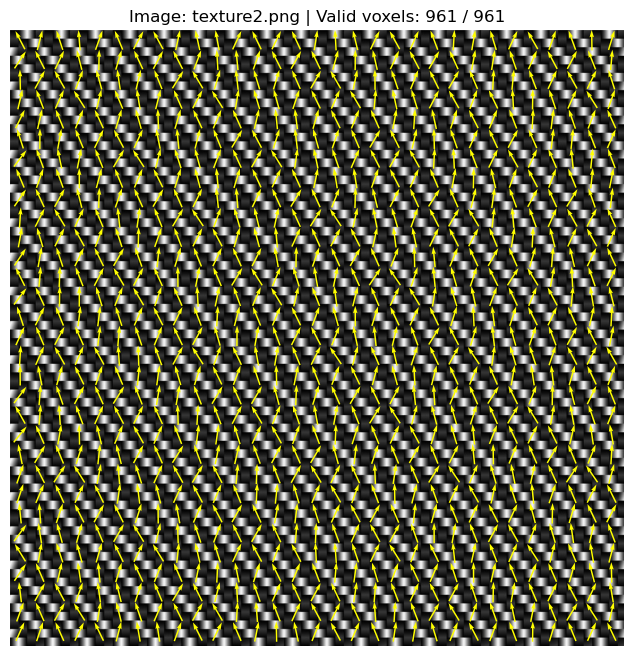

In [21]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/test_samples'
VOXEL_SIZE = 32

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.png')]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name, x, y, u, v, counts, scale=30, color="yellow")

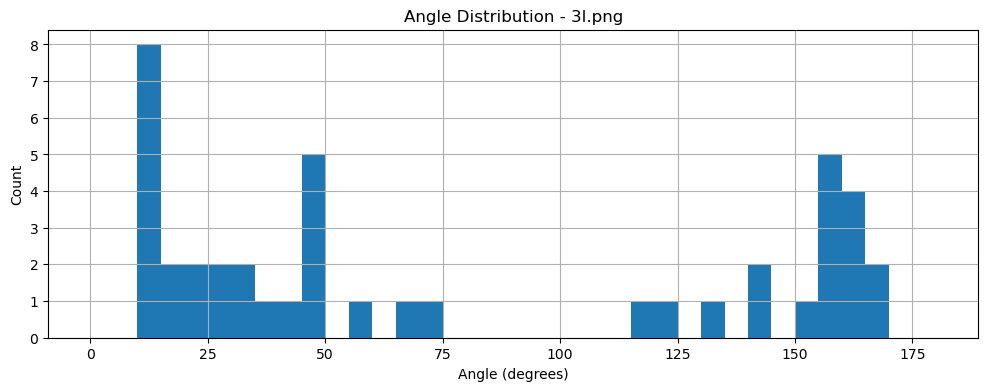

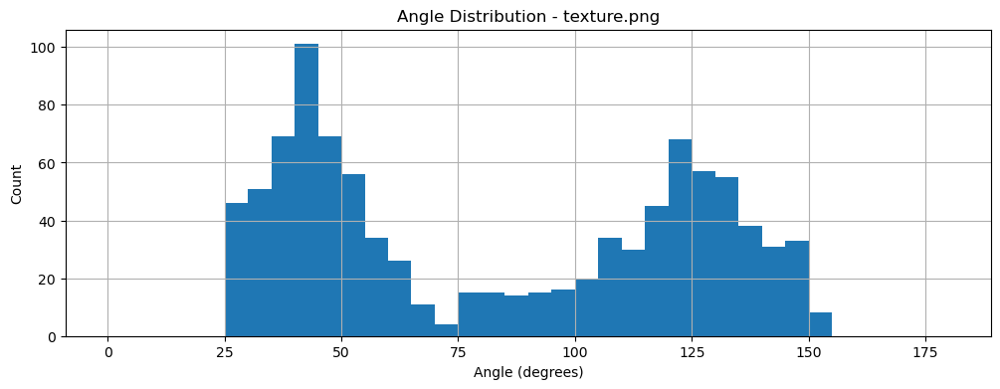

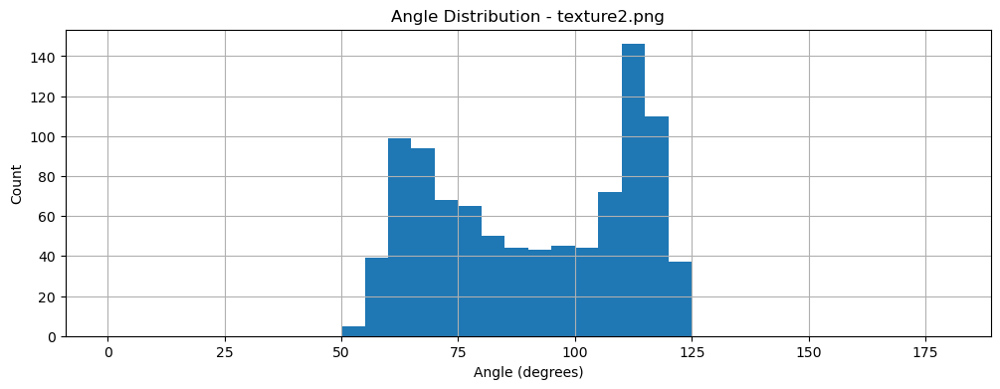

In [22]:
# Process images again but this time analyze angle distributions
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    image = np.array(Image.open(img_path).convert('L'))
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    _, _, _, _, angle_list, _ = get_orientation_map(model, voxel_list, pos_list, VOXEL_SIZE)
    plot_angle_distribution(angle_list, img_name)

##  Test: Inferencing on Torus Slices with Diffusion Combined Model


Found 15 test images


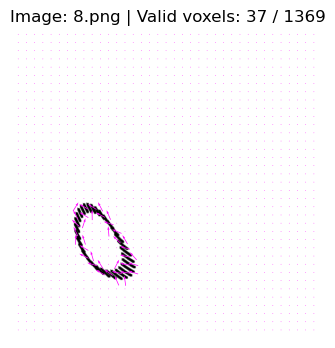

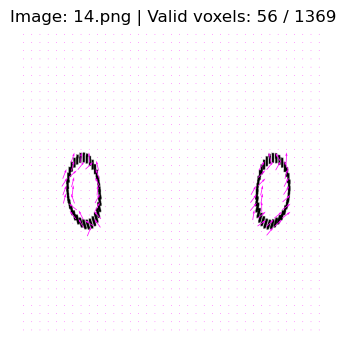

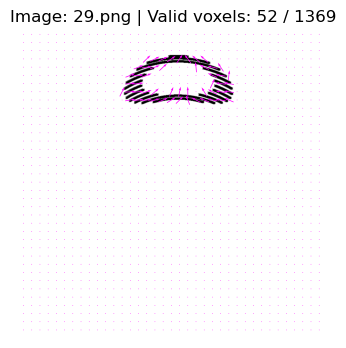

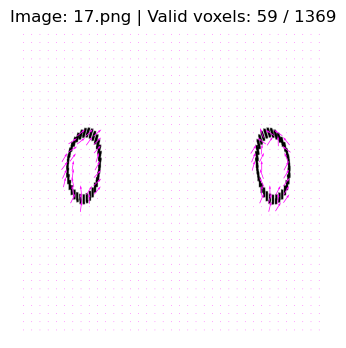

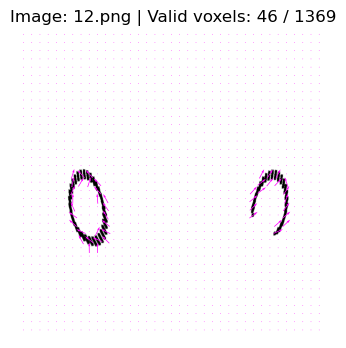

...

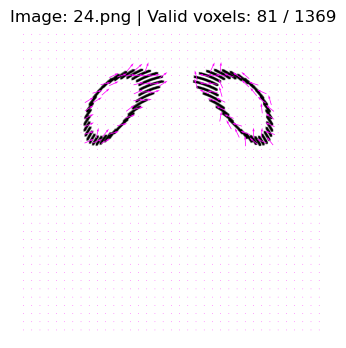

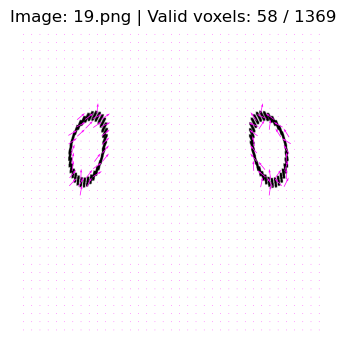

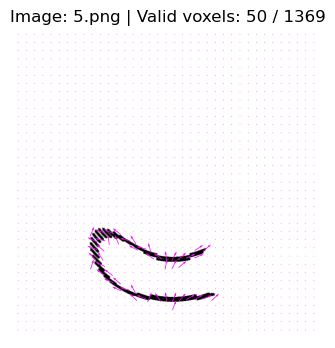

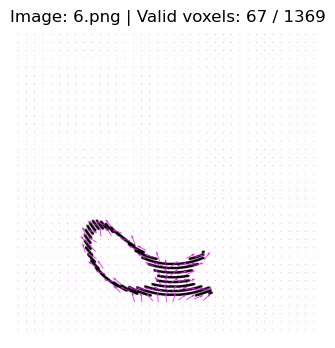

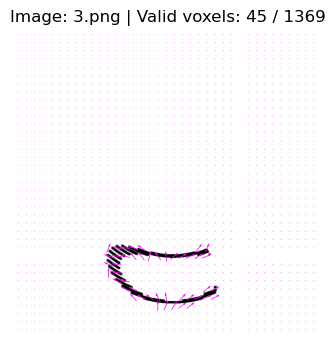

In [23]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/test_samples/XY'
VOXEL_SIZE = 24

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.png')][::2]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name, x, y, u, v, counts, scale=30, color='magenta', figsize=(4, 4))

##  Test: Inferencing on Diffusion Images with Diffusion Combined Model


Found 7 test images


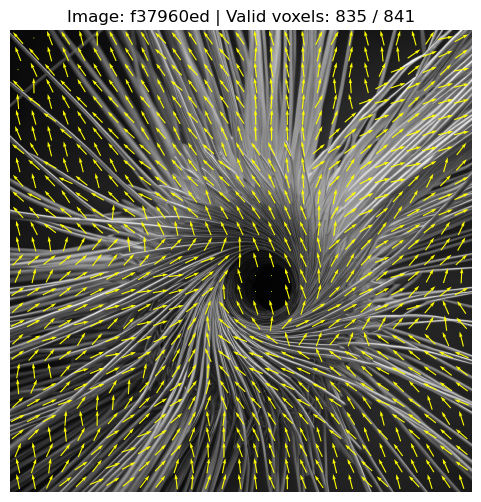

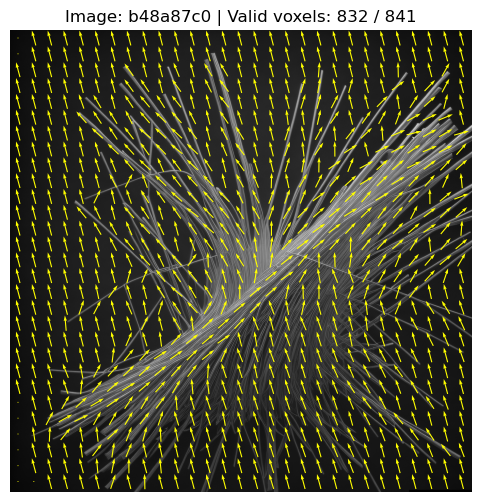

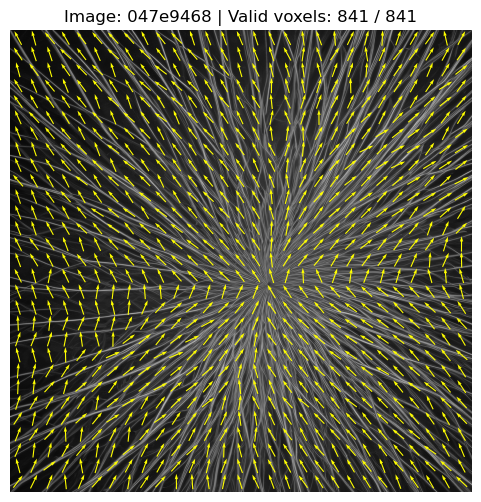

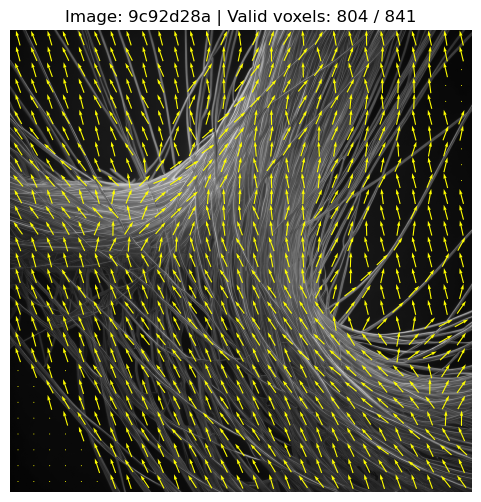

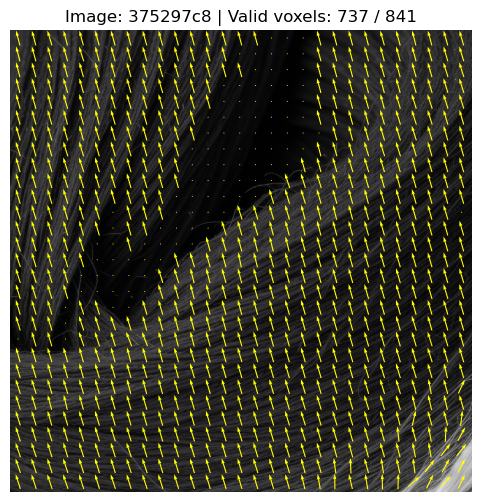

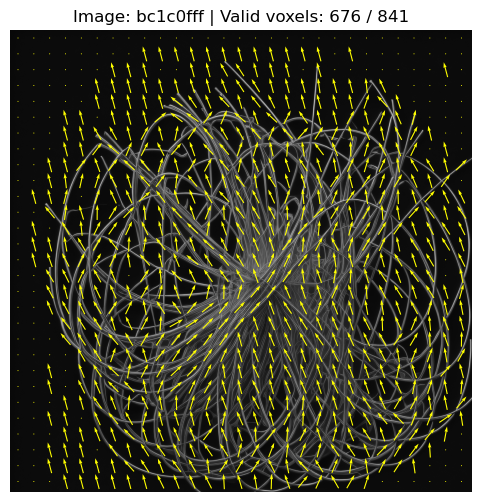

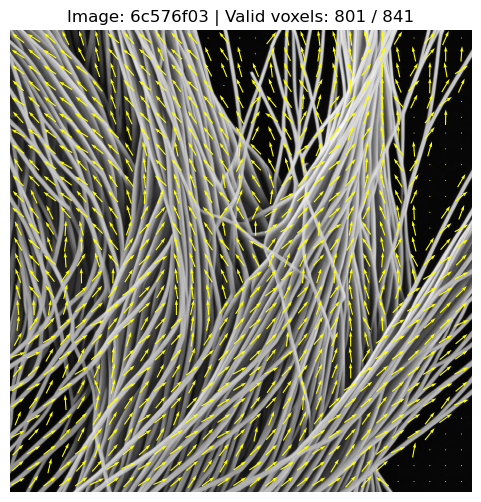

In [24]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/diffusion_src/big'
VOXEL_SIZE = 96

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.png')][::2]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name[:8], x, y, u, v, counts, scale=30, color='yellow', figsize=(6, 6))